<a href="https://colab.research.google.com/github/Sabit-Ahmed/tfjs-model-conversion/blob/main/Checkpoint_to_model_pb_model_tflite_model_json.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TensorFlow Saved Model Generation and Converting into both TFLite and **TFJS**

In [ ]:
!pip install tensorflow

In [ ]:
import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 2673, done.
remote: Counting objects: 100% (2673/2673), done.
remote: Compressing objects: 100% (2226/2226), done.
remote: Total 2673 (delta 675), reused 1335 (delta 415), pack-reused 0
Receiving objects: 100% (2673/2673), 32.65 MiB | 20.19 MiB/s, done.
Resolving deltas: 100% (675/675), done.


In [ ]:
!man protoc

In [ ]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

In [ ]:
import matplotlib
import matplotlib.pyplot as plt

import os
import random
import io
import imageio
import glob
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage

import tensorflow as tf

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import colab_utils
from object_detection.utils import config_util
from object_detection.builders import model_builder

%matplotlib inline

**Test Image from COCO**

In [ ]:
# Download COCO'17 validation set for test image
%%bash
mkdir -p coco && cd coco
wget -q -N http://images.cocodataset.org/zips/val2017.zip
unzip -q -o val2017.zip && rm *.zip
cd ..

## **Utilities for Inference**

In [ ]:
def detect(interpreter, input_tensor, include_keypoint=False):
  """Run detection on an input image.

  Args:
    interpreter: tf.lite.Interpreter
    input_tensor: A [1, height, width, 3] Tensor of type tf.float32.
      Note that height and width can be anything since the image will be
      immediately resized according to the needs of the model within this
      function.
    include_keypoint: True if model supports keypoints output. See
      https://cocodataset.org/#keypoints-2020

  Returns:
    A sequence containing the following output tensors:
      boxes: a numpy array of shape [N, 4]
      classes: a numpy array of shape [N]. Note that class indices are 
        1-based, and match the keys in the label map.
      scores: a numpy array of shape [N] or None.  If scores=None, then
        this function assumes that the boxes to be plotted are groundtruth
        boxes and plot all boxes as black with no classes or scores.
      category_index: a dict containing category dictionaries (each holding
        category index `id` and category name `name`) keyed by category 
        indices.
    If include_keypoints is True, the following are also returned:
      keypoints: (optional) a numpy array of shape [N, 17, 2] representing
        the yx-coordinates of the detection 17 COCO human keypoints
        (https://cocodataset.org/#keypoints-2020) in normalized image frame
        (i.e. [0.0, 1.0]). 
      keypoint_scores: (optional) a numpy array of shape [N, 17] representing the
        keypoint prediction confidence scores.
  """
  input_details = interpreter.get_input_details()
  output_details = interpreter.get_output_details()

  interpreter.set_tensor(input_details[0]['index'], input_tensor.numpy())

  interpreter.invoke()

  boxes = interpreter.get_tensor(output_details[0]['index'])
  classes = interpreter.get_tensor(output_details[1]['index'])
  scores = interpreter.get_tensor(output_details[2]['index'])
  num_detections = interpreter.get_tensor(output_details[3]['index'])

  if include_keypoint:
    kpts = interpreter.get_tensor(output_details[4]['index'])
    kpts_scores = interpreter.get_tensor(output_details[5]['index'])
    return boxes, classes, scores, num_detections, kpts, kpts_scores
  else:
    return boxes, classes, scores, num_detections

# Utility for visualizing results
def plot_detections(image_np,
                    boxes,
                    classes,
                    scores,
                    category_index,
                    keypoints=None,
                    keypoint_scores=None,
                    figsize=(12, 16),
                    image_name=None):
  """Wrapper function to visualize detections.

  Args:
    image_np: uint8 numpy array with shape (img_height, img_width, 3)
    boxes: a numpy array of shape [N, 4]
    classes: a numpy array of shape [N]. Note that class indices are 1-based,
      and match the keys in the label map.
    scores: a numpy array of shape [N] or None.  If scores=None, then
      this function assumes that the boxes to be plotted are groundtruth
      boxes and plot all boxes as black with no classes or scores.
    category_index: a dict containing category dictionaries (each holding
      category index `id` and category name `name`) keyed by category indices.
    keypoints: (optional) a numpy array of shape [N, 17, 2] representing the 
      yx-coordinates of the detection 17 COCO human keypoints
      (https://cocodataset.org/#keypoints-2020) in normalized image frame
      (i.e. [0.0, 1.0]). 
    keypoint_scores: (optional) anumpy array of shape [N, 17] representing the
      keypoint prediction confidence scores.
    figsize: size for the figure.
    image_name: a name for the image file.
  """

  keypoint_edges = [(0, 1),
        (0, 2),
        (1, 3),
        (2, 4),
        (0, 5),
        (0, 6),
        (5, 7),
        (7, 9),
        (6, 8),
        (8, 10),
        (5, 6),
        (5, 11),
        (6, 12),
        (11, 12),
        (11, 13),
        (13, 15),
        (12, 14),
        (14, 16)]
  image_np_with_annotations = image_np.copy()
  # Only visualize objects that get a score > 0.3.
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      keypoints=keypoints,
      keypoint_scores=keypoint_scores,
      keypoint_edges=keypoint_edges,
      use_normalized_coordinates=True,
      min_score_thresh=0.3)
  if image_name:
    plt.imsave(image_name, image_np_with_annotations)
  else:
    return image_np_with_annotations

### **Object Detection**

**Download Model from Detection Zoo**

In [ ]:
# Get mobile-friendly CenterNet for Keypoint detection task.
# See TensorFlow 2 Detection Model Zoo for more details:
# https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md

%%bash
wget http://download.tensorflow.org/models/object_detection/tf2/20210210/centernet_mobilenetv2fpn_512x512_coco17_od.tar.gz
tar -xf centernet_mobilenetv2fpn_512x512_coco17_od.tar.gz
rm centernet_mobilenetv2fpn_512x512_coco17_od.tar.gz*

### **Generate saved_model**

In [ ]:
%%bash
# Export the intermediate SavedModel that outputs 10 detections & takes in an 
# image of dim 320x320.
# Modify these parameters according to your needs.

python models/research/object_detection/export_tflite_graph_tf2.py \
  --pipeline_config_path=centernet_mobilenetv2_fpn_od/pipeline.config \
  --trained_checkpoint_dir=centernet_mobilenetv2_fpn_od/checkpoint \
  --output_directory=output_saved_models/centernet_mobilenetv2_fpn_od \
  --centernet_include_keypoints=false \
  --max_detections=10 \
  --config_override=" \
    model{ \
      center_net { \
        image_resizer { \
          fixed_shape_resizer { \
            height: 320 \
            width: 320 \
          } \
        } \
      } \
    }"

### **Convert saved_model to tflite model**

In [ ]:
!mkdir output_tflite_models

mkdir: cannot create directory ‘centernet_mobilenetv2_fpn_od’: File exists


In [ ]:
!mkdir output_tflite_models/centernet_mobilenetv2_fpn_od

In [ ]:
# Generate TensorFlow Lite model using the converter.

%%bash
tflite_convert --output_file=output_tflite_models/centernet_mobilenetv2_fpn_od/model.tflite \
  --saved_model_dir=output_saved_models/centernet_mobilenetv2_fpn_od/saved_model

**TensorFlow Lite Inference**

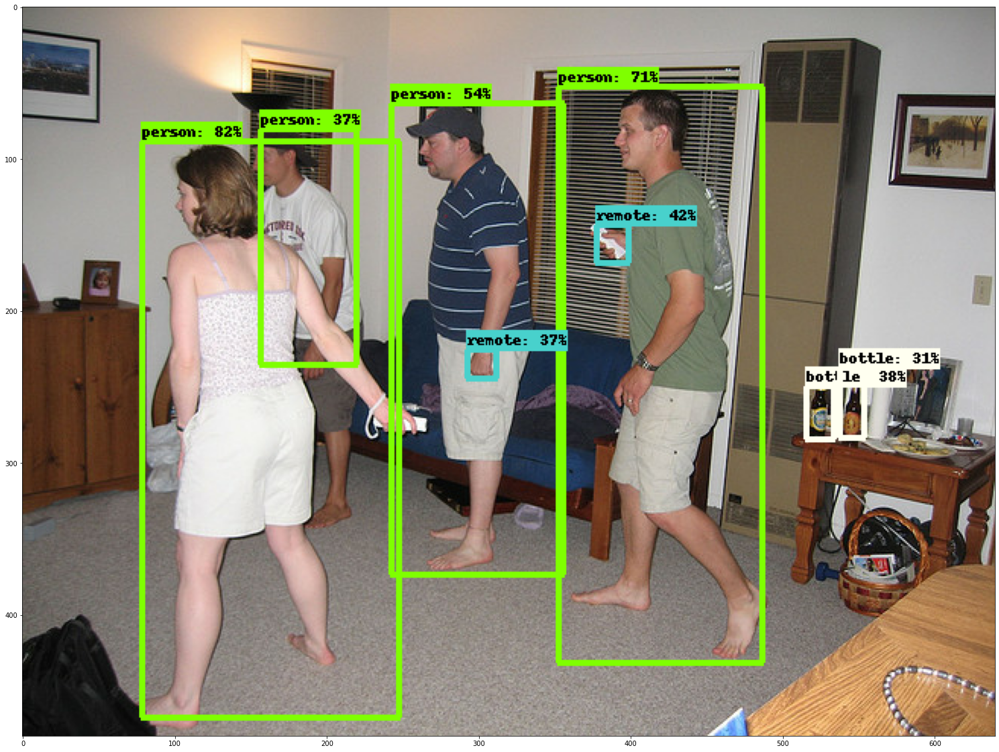

In [ ]:
%matplotlib inline

# Load the TFLite model and allocate tensors.
# model_path = 'centernet_mobilenetv2_fpn_od/model.tflite'
model_path = 'output_tflite_models/centernet_mobilenetv2_fpn_od/model.tflite'
label_map_path = 'centernet_mobilenetv2_fpn_od/label_map.txt'
image_path = 'coco/val2017/000000013729.jpg'

# Initialize TensorFlow Lite Interpreter.
interpreter = tf.lite.Interpreter(model_path=model_path)
interpreter.allocate_tensors()

# Label map can be used to figure out what class ID maps to what
# label. `label_map.txt` is human-readable.
category_index = label_map_util.create_category_index_from_labelmap(
    label_map_path)

label_id_offset = 1

image = tf.io.read_file(image_path)
image = tf.compat.v1.image.decode_jpeg(image)
image = tf.expand_dims(image, axis=0)
image_numpy = image.numpy()

input_tensor = tf.convert_to_tensor(image_numpy, dtype=tf.float32)
# Note that CenterNet doesn't require any pre-processing except resizing to the
# input size that the TensorFlow Lite Interpreter was generated with.
input_tensor = tf.image.resize(input_tensor, (320, 320))
boxes, classes, scores, num_detections = detect(interpreter, input_tensor)

vis_image = plot_detections(
    image_numpy[0],
    boxes[0],
    classes[0].astype(np.uint32) + label_id_offset,
    scores[0],
    category_index)
plt.figure(figsize = (30, 20))
plt.imshow(vis_image)

### **Keypoints Detection**

**Download Model from Detection Zoo**

Though the saved_model can be downloaded directly from the following link, it's recommended to generate the models from the checkpoints again and generate saved_model by yourself.

In [ ]:
# Get mobile-friendly CenterNet for Keypoint detection task.
# See TensorFlow 2 Detection Model Zoo for more details:
# https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md

%%bash
wget http://download.tensorflow.org/models/object_detection/tf2/20210210/centernet_mobilenetv2fpn_512x512_coco17_kpts.tar.gz
tar -xf centernet_mobilenetv2fpn_512x512_coco17_kpts.tar.gz
rm centernet_mobilenetv2fpn_512x512_coco17_kpts.tar.gz*

### **Generate saved_model**

In [ ]:
%%bash
# Export the intermediate SavedModel that outputs 10 detections & takes in an 
# image of dim 320x320.
# Modify these parameters according to your needs.

python models/research/object_detection/export_tflite_graph_tf2.py \
  --pipeline_config_path=centernet_mobilenetv2_fpn_kpts/pipeline.config \
  --trained_checkpoint_dir=centernet_mobilenetv2_fpn_kpts/checkpoint \
  --output_directory=output_saved_models/centernet_mobilenetv2_fpn_kpts \
  --centernet_include_keypoints=true \
  --keypoint_label_map_path=centernet_mobilenetv2_fpn_kpts/label_map.txt \
  --max_detections=10 \
  --config_override=" \
    model{ \
      center_net { \
        image_resizer { \
          fixed_shape_resizer { \
            height: 320 \
            width: 320 \
          } \
        } \
      } \
    }"

### **Convert saved_model to tflite model**

In [ ]:
!mkdir output_tflite_models/centernet_mobilenetv2_fpn_kpts

In [ ]:

# Generate TensorFlow Lite model using the converter.

%%bash
tflite_convert --output_file=output_tflite_models/centernet_mobilenetv2_fpn_kpts/model.tflite \
  --saved_model_dir=output_saved_models/centernet_mobilenetv2_fpn_kpts/saved_model

**TensorFlow Lite Inference**

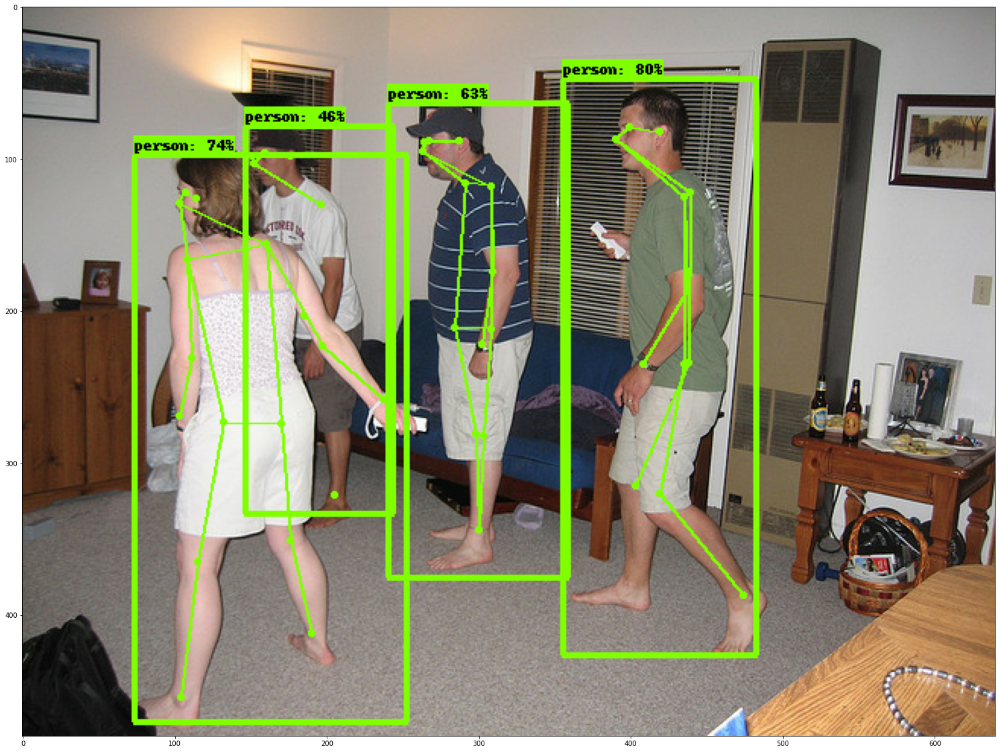

In [ ]:
%matplotlib inline

# Load the TFLite model and allocate tensors.
# model_path = 'centernet_mobilenetv2_fpn_kpts/model.tflite'
model_path = 'output_tflite_models/centernet_mobilenetv2_fpn_kpts/model.tflite'
image_path = 'coco/val2017/000000013729.jpg'

# Initialize TensorFlow Lite Interpreter.
interpreter = tf.lite.Interpreter(model_path=model_path)
interpreter.allocate_tensors()

# Keypoints are only relevant for people, so we only care about that
# category Id here.
category_index = {1: {'id': 1, 'name': 'person'}}

label_id_offset = 1

image = tf.io.read_file(image_path)
image = tf.compat.v1.image.decode_jpeg(image)
image = tf.expand_dims(image, axis=0)
image_numpy = image.numpy()

input_tensor = tf.convert_to_tensor(image_numpy, dtype=tf.float32)
# Note that CenterNet doesn't require any pre-processing except resizing to
# input size that the TensorFlow Lite Interpreter was generated with.
input_tensor = tf.image.resize(input_tensor, (320, 320))
(boxes, classes, scores, num_detections, kpts, kpts_scores) = detect(
    interpreter, input_tensor, include_keypoint=True)

vis_image = plot_detections(
    image_numpy[0],
    boxes[0],
    classes[0].astype(np.uint32) + label_id_offset,
    scores[0],
    category_index,
    keypoints=kpts[0],
    keypoint_scores=kpts_scores[0])
plt.figure(figsize = (30, 20))
plt.imshow(vis_image)

### **Load any arbitary TensorFlow2 model and generate checkpoint**

Load mobile-friendly model

In [ ]:
# Download the checkpoint and put it into models/research/object_detection/test_data/

!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
!tar -xf ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
!if [ -d "models/research/object_detection/test_data/checkpoint" ]; then rm -Rf models/research/object_detection/test_data/checkpoint; fi
!mkdir models/research/object_detection/test_data/checkpoint
!mv ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint models/research/object_detection/test_data/

--2021-05-25 13:33:00--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 64.233.189.128, 2404:6800:4008:c01::80
Connecting to download.tensorflow.org (download.tensorflow.org)|64.233.189.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20515344 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_fp 100%[===================>]  19.56M  36.6MB/s    in 0.5s    

2021-05-25 13:33:01 (36.6 MB/s) - ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’ saved [20515344/20515344]



In [ ]:
tf.keras.backend.clear_session()

print('Building model and restoring weights for fine-tuning...', flush=True)
num_classes = 1
pipeline_config = 'models/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config'
checkpoint_path = 'models/research/object_detection/test_data/checkpoint/ckpt-0'

# This will be where we save checkpoint & config for TFLite conversion later.
output_directory = 'output_checkpoints/'
output_checkpoint_dir = os.path.join(output_directory, 'checkpoint')

# Load pipeline config and build a detection model.
#
# Since we are working off of a COCO architecture which predicts 90
# class slots by default, we override the `num_classes` field here to be just
# one (for our new rubber ducky class).
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
model_config.ssd.num_classes = num_classes
model_config.ssd.freeze_batchnorm = True
detection_model = model_builder.build(
      model_config=model_config, is_training=True)
# Save new pipeline config
pipeline_proto = config_util.create_pipeline_proto_from_configs(configs)
config_util.save_pipeline_config(pipeline_proto, output_directory)

# Set up object-based checkpoint restore --- SSD has two prediction
# `heads` --- one for classification, the other for box regression.  We will
# restore the box regression head but initialize the classification head
# from scratch (we show the omission below by commenting out the line that
# we would add if we wanted to restore both heads)
fake_box_predictor = tf.compat.v2.train.Checkpoint(
    _base_tower_layers_for_heads=detection_model._box_predictor._base_tower_layers_for_heads,
    # _prediction_heads=detection_model._box_predictor._prediction_heads,
    #    (i.e., the classification head that we *will not* restore)
    _box_prediction_head=detection_model._box_predictor._box_prediction_head,
    )
fake_model = tf.compat.v2.train.Checkpoint(
          _feature_extractor=detection_model._feature_extractor,
          _box_predictor=fake_box_predictor)
ckpt = tf.compat.v2.train.Checkpoint(model=fake_model)
ckpt.restore(checkpoint_path).expect_partial()

# To save checkpoint for TFLite conversion.
exported_ckpt = tf.compat.v2.train.Checkpoint(model=detection_model)
ckpt_manager = tf.train.CheckpointManager(
    exported_ckpt, output_checkpoint_dir, max_to_keep=1)

# Run model through a dummy image so that variables are created
image, shapes = detection_model.preprocess(tf.zeros([1, 320, 320, 3]))
prediction_dict = detection_model.predict(image, shapes)
_ = detection_model.postprocess(prediction_dict, shapes)
print('Weights restored!')

Building model and restoring weights for fine-tuning...
INFO:tensorflow:Writing pipeline config file to output_checkpoints/pipeline.config
Weights restored!


In [ ]:
ckpt_manager.save()
print('Checkpoint saved!')

Checkpoint saved!


You can get the saved model directly from "sd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz" directory. Or you can generate saved_model by saving the checkpoint by adding the extra lines in the previous cell.

These following steps are required if you do not want only the pretrained model, rather you want to transfer learn the pretrained model.

### **Fine Tuning and Transfer Learning**

### **Utilities for arbitary models**

In [ ]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path.

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

def plot_detections(image_np,
                    boxes,
                    classes,
                    scores,
                    category_index,
                    figsize=(12, 16),
                    image_name=None):
  """Wrapper function to visualize detections.

  Args:
    image_np: uint8 numpy array with shape (img_height, img_width, 3)
    boxes: a numpy array of shape [N, 4]
    classes: a numpy array of shape [N]. Note that class indices are 1-based,
      and match the keys in the label map.
    scores: a numpy array of shape [N] or None.  If scores=None, then
      this function assumes that the boxes to be plotted are groundtruth
      boxes and plot all boxes as black with no classes or scores.
    category_index: a dict containing category dictionaries (each holding
      category index `id` and category name `name`) keyed by category indices.
    figsize: size for the figure.
    image_name: a name for the image file.
  """
  image_np_with_annotations = image_np.copy()
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates=True,
      min_score_thresh=0.8)
  if image_name:
    plt.imsave(image_name, image_np_with_annotations)
  else:
    plt.imshow(image_np_with_annotations)

### **Transfer Learning**

**Data Generation**

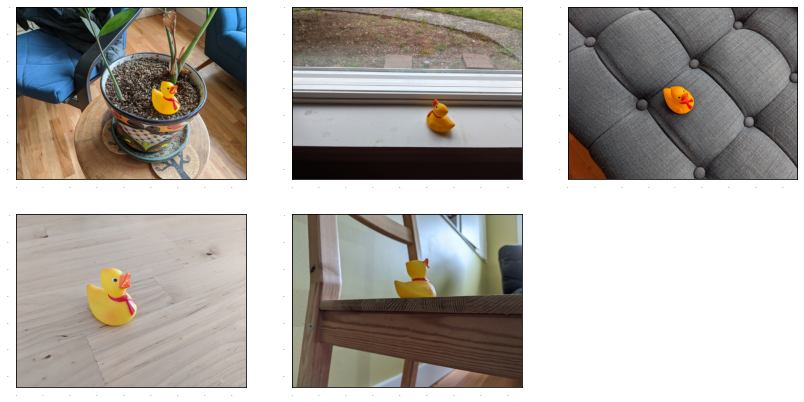

In [ ]:
# Load images and visualize
train_image_dir = 'models/research/object_detection/test_images/ducky/train/'
train_images_np = []
for i in range(1, 6):
  image_path = os.path.join(train_image_dir, 'robertducky' + str(i) + '.jpg')
  train_images_np.append(load_image_into_numpy_array(image_path))

plt.rcParams['axes.grid'] = False
plt.rcParams['xtick.labelsize'] = False
plt.rcParams['ytick.labelsize'] = False
plt.rcParams['xtick.top'] = False
plt.rcParams['xtick.bottom'] = False
plt.rcParams['ytick.left'] = False
plt.rcParams['ytick.right'] = False
plt.rcParams['figure.figsize'] = [14, 7]

for idx, train_image_np in enumerate(train_images_np):
  plt.subplot(2, 3, idx+1)
  plt.imshow(train_image_np)
plt.show()

**Data Preparation**

In [ ]:
gt_boxes = [
            np.array([[0.436, 0.591, 0.629, 0.712]], dtype=np.float32),
            np.array([[0.539, 0.583, 0.73, 0.71]], dtype=np.float32),
            np.array([[0.464, 0.414, 0.626, 0.548]], dtype=np.float32),
            np.array([[0.313, 0.308, 0.648, 0.526]], dtype=np.float32),
            np.array([[0.256, 0.444, 0.484, 0.629]], dtype=np.float32)
]

# By convention, our non-background classes start counting at 1.  Given
# that we will be predicting just one class, we will therefore assign it a
# `class id` of 1.
duck_class_id = 1
num_classes = 1

category_index = {duck_class_id: {'id': duck_class_id, 'name': 'rubber_ducky'}}

# Convert class labels to one-hot; convert everything to tensors.
# The `label_id_offset` here shifts all classes by a certain number of indices;
# we do this here so that the model receives one-hot labels where non-background
# classes start counting at the zeroth index.  This is ordinarily just handled
# automatically in our training binaries, but we need to reproduce it here.
label_id_offset = 1
train_image_tensors = []
gt_classes_one_hot_tensors = []
gt_box_tensors = []
for (train_image_np, gt_box_np) in zip(
    train_images_np, gt_boxes):
  train_image_tensors.append(tf.expand_dims(tf.convert_to_tensor(
      train_image_np, dtype=tf.float32), axis=0))
  gt_box_tensors.append(tf.convert_to_tensor(gt_box_np, dtype=tf.float32))
  zero_indexed_groundtruth_classes = tf.convert_to_tensor(
      np.ones(shape=[gt_box_np.shape[0]], dtype=np.int32) - label_id_offset)
  gt_classes_one_hot_tensors.append(tf.one_hot(
      zero_indexed_groundtruth_classes, num_classes))
print('Done prepping data.')

Done prepping data.


**Data Vizualization after Preparation**

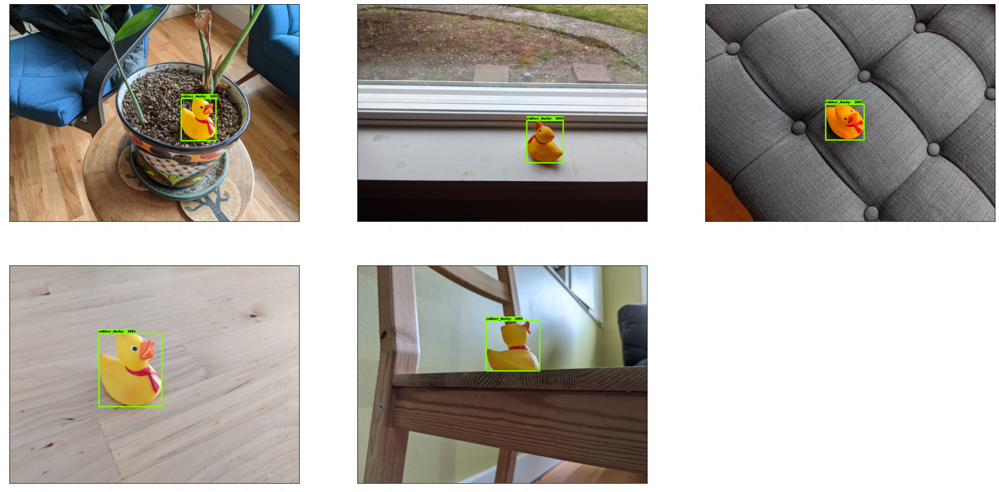

In [ ]:
dummy_scores = np.array([1.0], dtype=np.float32)  # give boxes a score of 100%

plt.figure(figsize=(30, 15))
for idx in range(5):
  plt.subplot(2, 3, idx+1)
  plot_detections(
      train_images_np[idx],
      gt_boxes[idx],
      np.ones(shape=[gt_boxes[idx].shape[0]], dtype=np.int32),
      dummy_scores, category_index)
plt.show()

In [ ]:
tf.keras.backend.set_learning_phase(True)

# These parameters can be tuned; since our training set has 5 images
# it doesn't make sense to have a much larger batch size, though we could
# fit more examples in memory if we wanted to.
batch_size = 5
learning_rate = 0.15
num_batches = 1000

# Select variables in top layers to fine-tune.
trainable_variables = detection_model.trainable_variables
to_fine_tune = []
prefixes_to_train = [
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead',
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead']
for var in trainable_variables:
  if any([var.name.startswith(prefix) for prefix in prefixes_to_train]):
    to_fine_tune.append(var)

# Set up forward + backward pass for a single train step.
def get_model_train_step_function(model, optimizer, vars_to_fine_tune):
  """Get a tf.function for training step."""

  # Use tf.function for a bit of speed.
  # Comment out the tf.function decorator if you want the inside of the
  # function to run eagerly.
  @tf.function
  def train_step_fn(image_tensors,
                    groundtruth_boxes_list,
                    groundtruth_classes_list):
    """A single training iteration.

    Args:
      image_tensors: A list of [1, height, width, 3] Tensor of type tf.float32.
        Note that the height and width can vary across images, as they are
        reshaped within this function to be 320x320.
      groundtruth_boxes_list: A list of Tensors of shape [N_i, 4] with type
        tf.float32 representing groundtruth boxes for each image in the batch.
      groundtruth_classes_list: A list of Tensors of shape [N_i, num_classes]
        with type tf.float32 representing groundtruth boxes for each image in
        the batch.

    Returns:
      A scalar tensor representing the total loss for the input batch.
    """
    shapes = tf.constant(batch_size * [[320, 320, 3]], dtype=tf.int32)
    model.provide_groundtruth(
        groundtruth_boxes_list=groundtruth_boxes_list,
        groundtruth_classes_list=groundtruth_classes_list)
    with tf.GradientTape() as tape:
      preprocessed_images = tf.concat(
          [detection_model.preprocess(image_tensor)[0]
           for image_tensor in image_tensors], axis=0)
      prediction_dict = model.predict(preprocessed_images, shapes)
      losses_dict = model.loss(prediction_dict, shapes)
      total_loss = losses_dict['Loss/localization_loss'] + losses_dict['Loss/classification_loss']
      gradients = tape.gradient(total_loss, vars_to_fine_tune)
      optimizer.apply_gradients(zip(gradients, vars_to_fine_tune))
    return total_loss

  return train_step_fn

optimizer = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)
train_step_fn = get_model_train_step_function(
    detection_model, optimizer, to_fine_tune)

print('Start fine-tuning!', flush=True)
for idx in range(num_batches):
  # Grab keys for a random subset of examples
  all_keys = list(range(len(train_images_np)))
  random.shuffle(all_keys)
  example_keys = all_keys[:batch_size]

  # Note that we do not do data augmentation in this demo.  If you want a
  # a fun exercise, we recommend experimenting with random horizontal flipping
  # and random cropping :)
  gt_boxes_list = [gt_box_tensors[key] for key in example_keys]
  gt_classes_list = [gt_classes_one_hot_tensors[key] for key in example_keys]
  image_tensors = [train_image_tensors[key] for key in example_keys]

  # Training step (forward pass + backwards pass)
  total_loss = train_step_fn(image_tensors, gt_boxes_list, gt_classes_list)

  if idx % 100 == 0:
    print('batch ' + str(idx) + ' of ' + str(num_batches)
    + ', loss=' +  str(total_loss.numpy()), flush=True)

print('Done fine-tuning!')

ckpt_manager.save()
print('Checkpoint saved!')

Start fine-tuning!


/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:435: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.
  warnings.warn('`tf.keras.backend.set_learning_phase` is deprecated and '


batch 0 of 1000, loss=1.2058007
batch 100 of 1000, loss=0.026276093
batch 200 of 1000, loss=0.008753257
batch 300 of 1000, loss=0.0044093905
batch 400 of 1000, loss=0.0027345642
batch 500 of 1000, loss=0.0019052648
batch 600 of 1000, loss=0.0014278383
batch 700 of 1000, loss=0.0011243164
batch 800 of 1000, loss=0.0009174035
batch 900 of 1000, loss=0.0007688723
Done fine-tuning!
Checkpoint saved!


**Checkpoint to saved_model**

In [ ]:
%%bash
python models/research/object_detection/export_tflite_graph_tf2.py \
  --pipeline_config_path output_checkpoints/pipeline.config \
  --trained_checkpoint_dir output_checkpoints/checkpoint \
  --output_directory output_saved_models/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8

**Saved_model to tflite**

In [ ]:
!mkdir output_tflite_models/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8

In [ ]:
!tflite_convert --saved_model_dir=output_saved_models/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/saved_model --output_file=output_tflite_models/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/model.tflite

**Test ssd MobileNet Model**

In [ ]:
test_image_dir = 'models/research/object_detection/test_images/ducky/test/'
test_images_np = []
for i in range(1, 50):
  image_path = os.path.join(test_image_dir, 'out' + str(i) + '.jpg')
  test_images_np.append(np.expand_dims(
      load_image_into_numpy_array(image_path), axis=0))

# Again, uncomment this decorator if you want to run inference eagerly
def detect(interpreter, input_tensor):
  """Run detection on an input image.

  Args:
    interpreter: tf.lite.Interpreter
    input_tensor: A [1, height, width, 3] Tensor of type tf.float32.
      Note that height and width can be anything since the image will be
      immediately resized according to the needs of the model within this
      function.

  Returns:
    A dict containing 3 Tensors (`detection_boxes`, `detection_classes`,
      and `detection_scores`).
  """
  input_details = interpreter.get_input_details()
  output_details = interpreter.get_output_details()

  # We use the original model for pre-processing, since the TFLite model doesn't
  # include pre-processing.
  preprocessed_image, shapes = detection_model.preprocess(input_tensor)
  interpreter.set_tensor(input_details[0]['index'], preprocessed_image.numpy())

  interpreter.invoke()

  boxes = interpreter.get_tensor(output_details[0]['index'])
  classes = interpreter.get_tensor(output_details[1]['index'])
  scores = interpreter.get_tensor(output_details[2]['index'])
  return boxes, classes, scores

# Load the TFLite model and allocate tensors.
interpreter = tf.lite.Interpreter(model_path="output_tflite_models/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/model.tflite")
interpreter.allocate_tensors()

# Note that the first frame will trigger tracing of the tf.function, which will
# take some time, after which inference should be fast.

label_id_offset = 1
for i in range(len(test_images_np)):
  input_tensor = tf.convert_to_tensor(test_images_np[i], dtype=tf.float32)
  boxes, classes, scores = detect(interpreter, input_tensor)

  plot_detections(
      test_images_np[i][0],
      boxes[0],
      classes[0].astype(np.uint32) + label_id_offset,
      scores[0],
      category_index, figsize=(15, 20), image_name="gif_frame_" + ('%02d' % i) + ".jpg")

Imageio: 'libfreeimage-3.16.0-linux64.so' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/freeimage/libfreeimage-3.16.0-linux64.so (4.6 MB)
Downloading: 8192/4830080 bytes (0.2%)540672/4830080 bytes (11.2%)1712128/4830080 bytes (35.4%)3137536/4830080 bytes (65.0%)4830080/4830080 bytes (100.0%)
  Done
File saved as /root/.imageio/freeimage/libfreeimage-3.16.0-linux64.so.


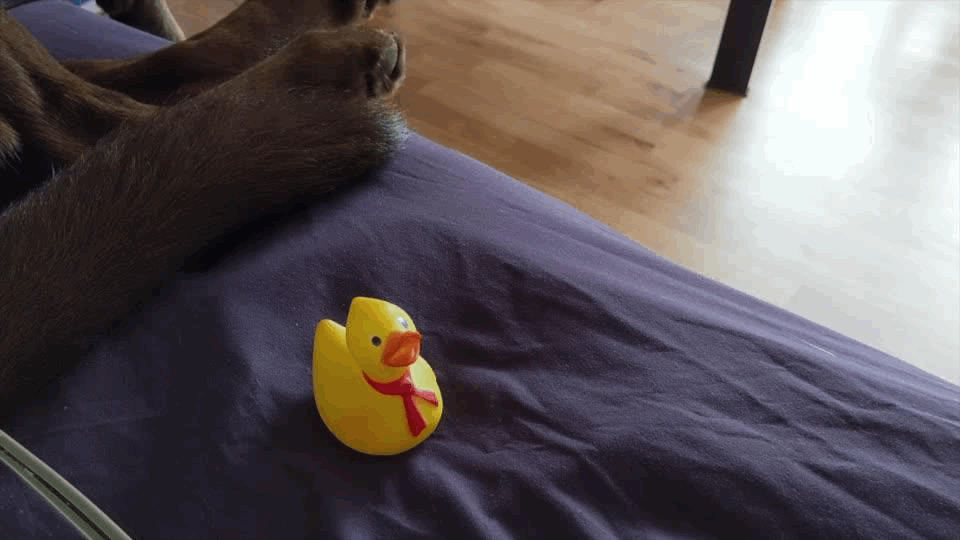

In [ ]:
imageio.plugins.freeimage.download()

anim_file = 'duckies_test.gif'

filenames = glob.glob('gif_frame_*.jpg')
filenames = sorted(filenames)
last = -1
images = []
for filename in filenames:
  image = imageio.imread(filename)
  images.append(image)

imageio.mimsave(anim_file, images, 'GIF-FI', fps=5)

display(IPyImage(open(anim_file, 'rb').read()))

### `**Convert saved_model to tfjs model**

In [ ]:
!pip install tensorflowjs

In [ ]:
!tensorflowjs_converter \
    --input_format=tf_saved_model \
    --output_node_names='scores' \
    --saved_model_tags=serve \
    /content/output_saved_models/centernet_mobilenetv2_fpn_kpts/saved_model \
    output_tfjs_models/web_model

In [ ]:
import os
from google.colab import files

for i in os.listdir('output_tfjs_models/web_model'):
  files.download('/content/output_tfjs_models/web_model/'+i)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>